In [113]:
import numpy as np
import os
import pandas as pd
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import mtcnn
from mtcnn import MTCNN
import matplotlib.patches as patches
import config as cg



In [114]:
path = 'C:/Users/ArshiaAchar/Desktop/DS_projects/Step2/Pre_processing/scraped_images_b1'
final_folder = 'C:/Users/ArshiaAchar/Desktop/DS_projects/Step2/Pre_processing/processed_real_images_b1'  # Replace with your desired path
os.makedirs(final_folder,exist_ok=True)
files = os.listdir(path)

for file in files:
    if file.endswith('.jpg') or file.endswith('.jpeg'):  # Check for JPG files
        print(file)
        break

24-01-2024-13-08-17-638657.jpg


In [115]:
file_path = os.path.join(path,file)

image = Image.open(file_path)
image.size

(5760, 3840)

#### Face Detection on images

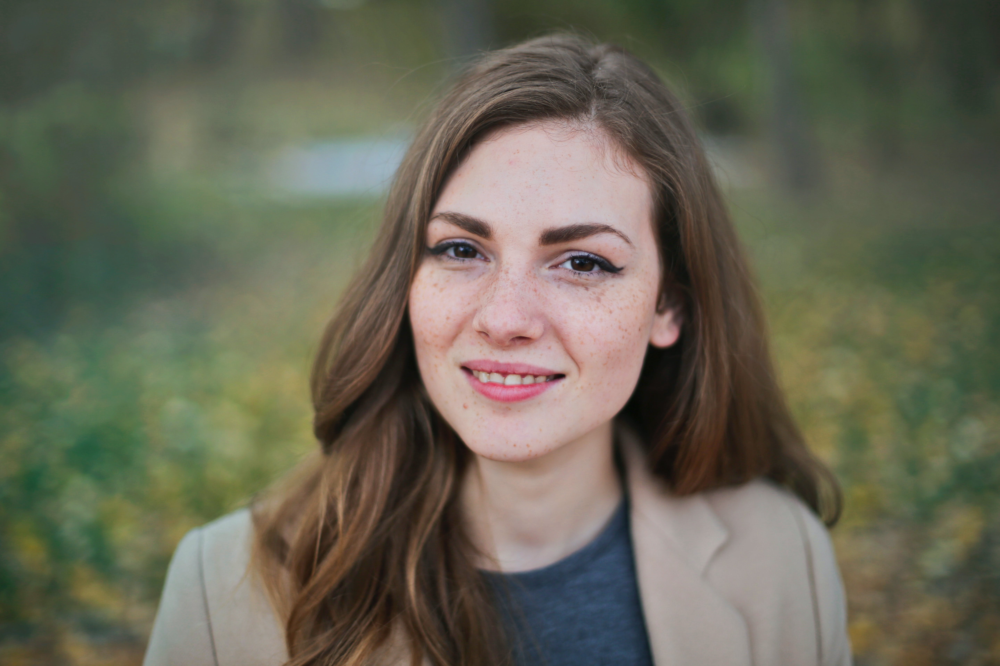

In [116]:
# plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
image

1/1 [==============================] - 0s 154ms/step


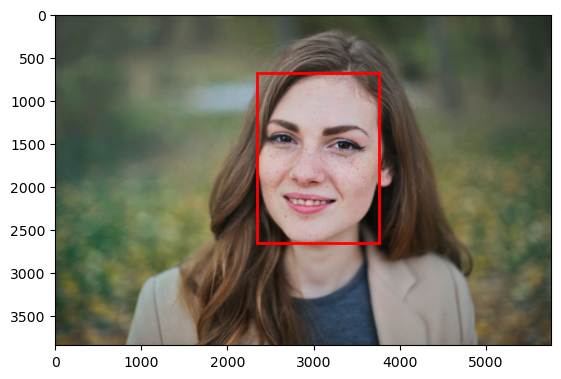

In [117]:
# create the detector, using default weights
detector = MTCNN()
# detect faces in the image
results = detector.detect_faces(np.array(image))

fig,ax = plt.subplots()
ax.imshow(image)

# Draw bounding boxes on the images
for face in results:
    bounding_box = face['box']
    rect = patches.Rectangle((bounding_box[0], bounding_box[1]), bounding_box[2], bounding_box[3], linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

plt.show()

### Extracting the detected face from the original image & resizing

In [118]:
x, y, width, height = results[0]['box']
face_region = image.crop((x, y, x + width, y + height))

resize = 224
# Resize the face region to 224x224
resized_face = face_region.resize((resize, resize))
    

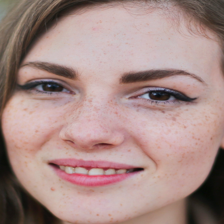

In [119]:
resized_face

### Mean Subtraction

In [120]:
resized_array = np.array(resized_face)
resized_array = resized_array[:,:,::-1] - cg.mean

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


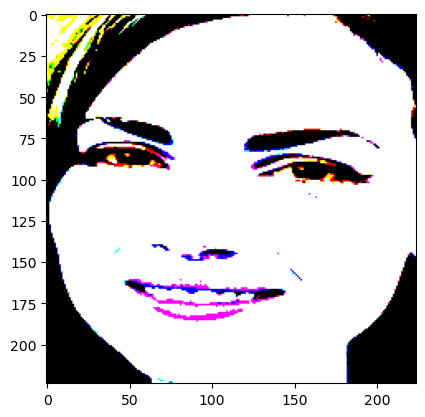

In [122]:
plt.imshow(resized_array)

### References

1. the main research paper
https://arxiv.org/pdf/1710.08092.pdf


2. Notebook reference for pre processing
https://github.com/WeidiXie/Keras-VGGFace2-ResNet50/blob/master/src/utils.py

In [84]:
# def load_data(path='', shape=None, mode='eval'):

#     short_size = 224.0
#     crop_size = shape
#     img = PIL.Image.open(path)
#     im_shape = np.array(img.size)    # in the format of (width, height, *)
#     img = img.convert('RGB')

#     ratio = float(short_size) / np.min(im_shape)
#     img = img.resize(size=(int(np.ceil(im_shape[0] * ratio)),   # width
#                            int(np.ceil(im_shape[1] * ratio))),  # height
#                      resample=PIL.Image.BILINEAR)

#     x = np.array(img)  # image has been transposed into (height, width)
#     newshape = x.shape[:2]
#     if mode == 'eval':    # center crop
#         h_start = (newshape[0] - crop_size[0])//2
#         w_start = (newshape[1] - crop_size[1])//2
#     else:
#         raise IOError('==> unknown mode.')
#     x = x[h_start:h_start+crop_size[0], w_start:w_start+crop_size[1]]
#     x = x[:, :, ::-1] - cg.mean
#     return x

### Saving preprocessed images

In [ ]:
# # Save or process the resized face
# resized_face_path = f'path/to/your/resized_face_{i}.jpg'
# resized_face.save(resized_face_path)
# print(f"Resized face saved to: {resized_face_path}")

In [ ]:
!pip i